<a href="https://colab.research.google.com/github/EdwFa/FR_Base/blob/main/FR_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Исследование БД физического развития детей и подростков в РФ**


**Авторы :** 
1. Eduard Fartushnyi, e.fartushnyi@d-health.institute 
2. Vladimir Nikolenko, nikolenko_v_n@staff.sechenov.ru

Sechenov University, Moscow 


ver.1.01, 27/06/2022 

# 1. Аннотация

База данных физического развития детей и подростков разработана коллективом авторов .... [ссылка].

В настоящей работе применялись технологии и методы машинного и глубокого обучения для решени задач:
- оценки корреляции показателей физического развития детей и подростков;
- кластеризации похожих по субъектам и регионам РФ;
- построения регресионных и проностических моделей.

Для построения прогностической модели изучались следующие методы машинного обучения :

1. Logistic Regression (LR);
2. Support Vector Machine (SVM), 
3. AdaBoosting (AB), 
4. GradientBoosting (GB), 
5. K-Nearest Neighbors (KNN), 
6. Random Forest (RF), 
7. Desicion Tree (DT), 
8. XGBoost (XGB)/

Обучаем на наборе: FR_Base.xls 

Полученные модели и результаты подтверждают предположение о возможности применения методов и технологий машинного обучения для оценки .... и построения прогнозных моделей для ....  




# 2. Исходные данные


**описать, ..... - пример из другой задачи :** 

*...Модели машинного обучения работают с данными собранными в ходе исследования первичного билиарного цирроза печени (ПБЦ), проведенного в клинике Майо в период с 1974 по 1984 год.*

*...Описание клинических предпосылок исследования и ковариат, записанных здесь, содержится в главе 0, особенно в разделе 0.2. of Fleming and Harrington, Counting Processes and Survival Analysis, Wiley, 1991.*
Текст, выделенный полужирным шрифтом
*Более подробное обсуждение можно найти в Dickson, et al., Hepatology 10:1-7 (1989) и в Markus, et al., N Eng J of Мед 320:1709-13 (1989).*

*...В общей сложности 424 пациента с ПБХ, направленные в клинику Майо за этот десятилетний период, соответствовали критериям включения в рандомизированное плацебо-контролируемое исследование препарата D-пеницилламин.*

*...Первые 312 случаев в наборе данных участвовали в рандомизированном исследовании и содержат в основном полные данные.*

*.. Дополнительные 112 пациентов не участвовали в клиническом испытании, но согласились на запись основных измерений и наблюдение за выживаемостью.*

*......*




# 3. Содержание и форматы исследуемых данных

База данных содержит 2762 записи кортежей из 27 полей со следующей структурой:


<a id="0"></a>
<font color="red" size=+1><b>см. In[13]:</b></font>


#4. Методы и алгоритмы исследования

#4.1. Применяемые методы и алгоритмы интеллектуальной обработки данных

# 4.2. Необходимые библиотеки

In [ ]:
!pip3 install pyforest
!pip3 install termcolor
!pip3 install colorama
!pip install catboost

In [2]:
import warnings
import itertools

import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_curve, auc
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

from imblearn.over_sampling import SMOTE

from xgboost import XGBClassifier
from catboost import CatBoostClassifier

from tensorflow.keras.layers import Conv1D, Dense, Input, MaxPooling1D, Dropout, Flatten
from tensorflow.keras.models import Sequential

from colorama import Fore, Back, Style
from yellowbrick.classifier import ROCAUC

sns.set_style('dark')
warnings.filterwarnings('ignore')

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as stats
import pyforest
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder, StandardScaler, PowerTransformer, MinMaxScaler, LabelEncoder, RobustScaler
from sklearn.model_selection import RepeatedStratifiedKFold, KFold, cross_val_predict, train_test_split, GridSearchCV, cross_val_score, cross_validate
from sklearn.linear_model import LinearRegression, Lasso, Ridge,ElasticNet
from sklearn.metrics import plot_confusion_matrix, r2_score, mean_absolute_error, mean_squared_error, classification_report, confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import make_scorer, precision_score, precision_recall_curve, plot_precision_recall_curve, plot_roc_curve, roc_auc_score, roc_curve, f1_score, accuracy_score, recall_score
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostClassifier
from sklearn.feature_selection import SelectKBest, SelectPercentile, f_classif, f_regression, mutual_info_regression
from xgboost import XGBRegressor, XGBClassifier
from xgboost import plot_importance
from sklearn.pipeline import Pipeline
from sklearn.tree import plot_tree
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.utils import shuffle

#importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

import warnings
warnings.filterwarnings('ignore')
warnings.warn("this will not show")
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('max_colwidth',200)

# pd.set_option('display.max_rows', 100) # if you wish to see more rows rather than default, just uncomment this line.
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

import colorama
from colorama import Fore, Style  # maakes strings colored
# !pip3 install termcolor
from termcolor import colored

In [4]:
# библиотеки для интерактивных графиков iplot
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import iplot

import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 

import seaborn as sns

In [5]:
# for Statistic
import scipy.stats as stats
import math

In [6]:
%matplotlib notebook 
%matplotlib inline

 Дополняем функциями ... 


In [7]:
# Оценка пропущенных (пустых) значений 

def missing (df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

In [8]:
# Сводная информация о значениях в колонке данных csv-файла

def first_looking(col):
    print("column name    : ", col)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col].isnull().sum()/df.shape[0]*100, 2))
    print("num_of_nulls   : ", df[col].isnull().sum())
    print("num_of_uniques : ", df[col].nunique())
    print(df[col].value_counts(dropna = False))

In [9]:
# Оценка качества машинного обучения - по функциям из библиотек sklearn.metrics

def train_val(y_train, y_train_pred, y_test, y_pred):
    
    scores = {"train_set": {"Accuracy" : accuracy_score(y_train, y_train_pred),
                            "Precision" : precision_score(y_train, y_train_pred),
                            "Recall" : recall_score(y_train, y_train_pred),                          
                            "f1" : f1_score(y_train, y_train_pred)},
    
              "test_set": {"Accuracy" : accuracy_score(y_test, y_pred),
                           "Precision" : precision_score(y_test, y_pred),
                           "Recall" : recall_score(y_test, y_pred),                          
                           "f1" : f1_score(y_test, y_pred)}}
    
    return pd.DataFrame(scores)

In [10]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

# 4.3. Загрузка и предварительная обработка датасета

Загружаем dataset 



In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')
import io
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive/ColabNotebooks

# # Содержимое каталога
# ! ls
# Рабочая директория
# ! pwd

! ls
%cd /mydrive/ColabNotebooks/FR_Base
! ls
! pwd


In [12]:
df0=pd.read_excel('FR_Dataset.xlsx', sheet_name = 'Page_1') 


In [13]:
# информация о загруженных данных
df = df0
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2763 entries, 0 to 2762
Data columns (total 27 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Пол                                           2762 non-null   object 
 1   Пол 1-м 2-д                                   2762 non-null   float64
 2   ВозрастИсх                                    2762 non-null   object 
 3   Возраст                                       2762 non-null   float64
 4   N                                             2763 non-null   object 
 5   M длина тела, см                              2762 non-null   float64
 6   m                                             2609 non-null   float64
 7   σ                                             2649 non-null   object 
 8   V                                             2153 non-null   float64
 9   M масса тела, кг                              2760 non-null   f

In [14]:
df.head()

,Пол,Пол 1-м 2-д,ВозрастИсх,Возраст,N,"M длина тела, см",m,σ,V,"M масса тела, кг",m.1,σ.1,V.1,r,Rx/y,σR,Федеральный округ,Федеральный округ код,Субьект РФ,Субьект РФ код,Регион сбора материала,Город-1 село-2,"Населенный пункт (г - город, с - село)",Год сбора материала,Этническая принадлежность,Коренное население-1 мигрантное население-2,Кореное население
0,мужской,1.000,2.000,2.000,229.000,87.000,0.340,5.200,5.900,12.600,0.120,1.800,14.600,0.550,0.200,NaN,Южный федеральный округ,3.000,Республика Адыгея,1.000,г. Майкопа,1.000,г,NaN,Коренное население,1.000,адыгейцы
1,мужской,1.000,3.000,3.000,629.000,96.000,0.220,5.600,5.800,14.200,0.080,2.000,14.100,0.400,0.140,NaN,Южный федеральный округ,3.000,Республика Адыгея,1.000,г. Майкопа,1.000,г,NaN,Коренное население,1.000,адыгейцы
2,мужской,1.000,4.000,4.000,934.000,103.000,0.190,5.700,5.500,16.300,0.070,2.300,13.800,0.490,0.190,NaN,Южный федеральный округ,3.000,Республика Адыгея,1.000,г. Майкопа,1.000,г,NaN,Коренное население,1.000,адыгейцы
3,мужской,1.000,5.000,5.000,878.000,110.000,0.180,5.200,4.800,18.100,0.080,2.400,13.100,0.610,0.280,NaN,Южный федеральный округ,3.000,Республика Адыгея,1.000,г. Майкопа,1.000,г,NaN,Коренное население,1.000,адыгейцы
4,мужской,1.000,6.000,6.000,914.000,116.000,0.180,5.400,4.700,20.200,0.090,2.800,14.000,0.490,0.250,NaN,Южный федеральный округ,3.000,Республика Адыгея,1.000,г. Майкопа,1.000,г,NaN,Коренное население,1.000,адыгейцы


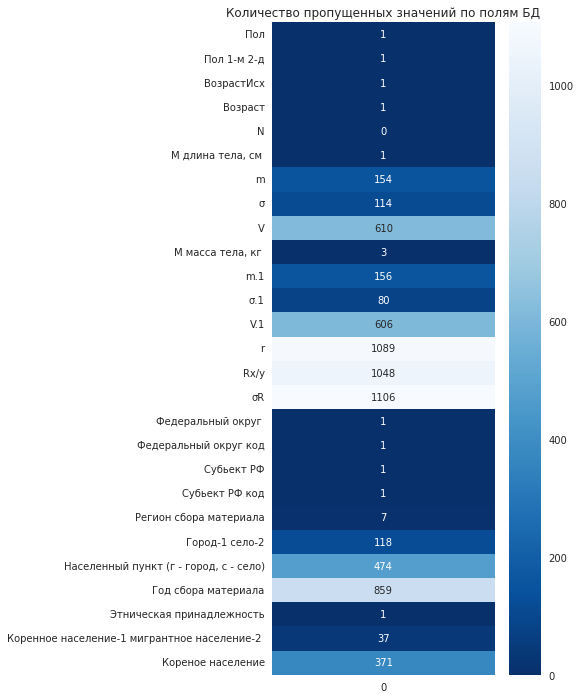

In [15]:
plt.figure(figsize=(5, 12))
plt.title('Количество пропущенных значений по полям БД')
ax = sns.heatmap(df.isna().sum().to_frame(), annot=True, fmt='d', cmap='Blues_r')
plt.show()

In [16]:
# удаляем с максимальными пропусками

drop_str = ['m', 'σ', 'V', 'm.1', 'σ.1',	'V.1',	'r',	'Rx/y',	'σR', 'Город-1 село-2', 'Населенный пункт (г - город, с - село)', 'Год сбора материала', 'Этническая принадлежность', 'Коренное население-1 мигрантное население-2 ', 'Кореное население']

for i in range(len(drop_str)):
  if drop_str[i] in df.columns:
    df = df.drop([drop_str[i]], axis=1)

df.head()

,Пол,Пол 1-м 2-д,ВозрастИсх,Возраст,N,"M длина тела, см","M масса тела, кг",Федеральный округ,Федеральный округ код,Субьект РФ,Субьект РФ код,Регион сбора материала
0,мужской,1.000,2.000,2.000,229.000,87.000,12.600,Южный федеральный округ,3.000,Республика Адыгея,1.000,г. Майкопа
1,мужской,1.000,3.000,3.000,629.000,96.000,14.200,Южный федеральный округ,3.000,Республика Адыгея,1.000,г. Майкопа
2,мужской,1.000,4.000,4.000,934.000,103.000,16.300,Южный федеральный округ,3.000,Республика Адыгея,1.000,г. Майкопа
3,мужской,1.000,5.000,5.000,878.000,110.000,18.100,Южный федеральный округ,3.000,Республика Адыгея,1.000,г. Майкопа
4,мужской,1.000,6.000,6.000,914.000,116.000,20.200,Южный федеральный округ,3.000,Республика Адыгея,1.000,г. Майкопа


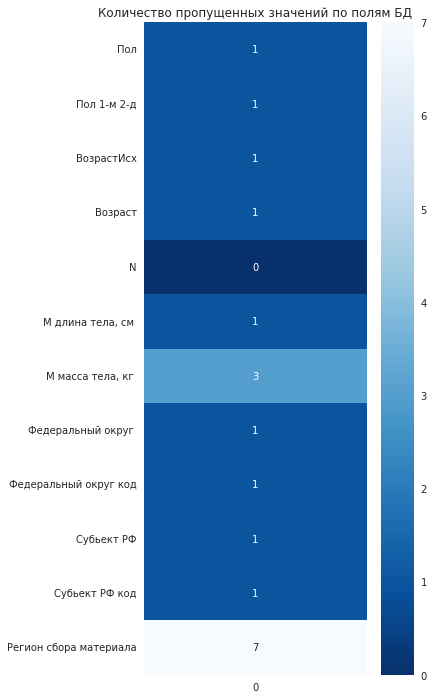

In [17]:
plt.figure(figsize=(5, 12))
plt.title('Количество пропущенных значений по полям БД')
ax = sns.heatmap(df.isna().sum().to_frame(), annot=True, fmt='d', cmap='Blues_r')
plt.show()

In [18]:
""" Либо удалить, либо заполняем отсутсвующие """
# числовые переменные - по средним значения
# категорийный - по часто встречающимся

# Numerical --> Median
numerical_columns = df.select_dtypes(include=(['int64', 'float64'])).columns

for c in numerical_columns:
    df[c].fillna(df[c].median(), inplace=True)
    
# Categorical --> Most Frequent
categorical_columns = df.select_dtypes(include=('object')).columns

for c in categorical_columns:
    df[c].fillna(df[c].mode().values[0], inplace=True)

    


In [ ]:
!pip3 -q install autoviz
!pip3 -q install xlrd

from autoviz.AutoViz_Class import AutoViz_Class

In [20]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

In [ ]:
configure_plotly_browser_state()
filename = ""
sep = ","
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar="",
    dfte=df,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None
)

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2763 entries, 0 to 2762
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Пол                     2763 non-null   object 
 1   Пол 1-м 2-д             2763 non-null   float64
 2   ВозрастИсх              2763 non-null   object 
 3   Возраст                 2763 non-null   float64
 4   N                       2763 non-null   object 
 5   M длина тела, см        2763 non-null   float64
 6   M масса тела, кг        2763 non-null   float64
 7   Федеральный округ       2763 non-null   object 
 8   Федеральный округ код   2763 non-null   float64
 9   Субьект РФ              2763 non-null   object 
 10  Субьект РФ код          2763 non-null   float64
 11  Регион сбора материала  2763 non-null   object 
dtypes: float64(6), object(6)
memory usage: 259.2+ KB


In [23]:
# Распределение выборки по Субъектам
configure_plotly_browser_state()
# df['Район'].iplot(kind='hist', xTitle='Выборка',
#                  yTitle='count', title='Распределение dataseta по районам')

df['Субьект РФ'].iplot(
    kind='hist',
    histnorm='percent',
    barmode='overlay',
    color='blue',
    xTitle='Район',
    yTitle='(%) от выборки РФ ',
    title='Процентное распределение выборки по Субъектам РФ')


In [24]:
# группировка ФО по названиям
df = df.replace({'Южный федеральный округ': 'Южный ФО',
                 'Приволжский федеральный округ': 'Приволжский ФО',
                 'Северо-Кавказский федеральный округ': 'Северо-Кавказский ФО',
                 'Дальневосточный федеральный округ': 'Дальневосточный ФО',
                 'Сибирский федеральный округ': 'Сибирский ФО',
                 'Северо-западный федеральный округ': 'Северо-западный ФО',
                 'Уральский федеральный округ': 'Уральский ФО',
                 'Уральский федеральный округ ': 'Уральский ФО',
                 'Центральный федеральный округ': 'Центральны ФО'
                 })




In [25]:
# Распределение выборки по федеральным округам
configure_plotly_browser_state()

fo_list = ['Южный ФО', 'Приволжский ФО', 'Северо-Кавказский ФО', 'Дальневосточный ФО', 'Сибирский ФО', 'Северо-западный ФО', 'Уральский ФО', 'Центральны ФО']     

df['Федеральный округ '].iplot(
    kind='hist',
    histnorm='percent',
    barmode='overlay',
    xTitle='Федеральный округ',
    yTitle='(%) от выборки РФ ',
    title='Процентное распределение выборки по Федеральным округам РФ')


<a id="4"></a>
<font color="lightseagreen" size=+2.5><b>4) Обзор загруженных данных</b></font>


**Преобразования данных**

In [26]:
# Замена наименований столбцов в датасете

df.rename(columns={'Пол 1-м 2-д': 'ПолIdx', 'M длина тела, см ': 'Рост', 'M масса тела, кг ': 'Вес'}, inplace=True)
df.rename(columns={'m': 'Рост_m', 'σ': 'Рост_σ', 'V': 'Рост_v'}, inplace=True)
df.rename(columns={'m.1': 'Вес_m', 'σ.1': 'Вес_σ', 'V.1': 'Вес_v'}, inplace=True)
df.rename(columns={'Федеральный округ ': 'FO', 'Федеральный округ код': 'FO_Cod', 'Субьект РФ': 'Sbj', 'Субьект РФ код': 'Sbj_Cod', 'Регион сбора материала': 'Region'}, inplace=True)
df.rename(columns={'Населенный пункт (г - город, с - село)': 'NP', 'Город-1 село-2': 'Гор-Сел','Год сбора материала': 'Year', 'Коренное население-1 мигрантное население-2 ': 'Ethnicity', 'Этническая принадлежность' : 'ethnic', 'Кореное население': 'IndigenousPopulation'}, inplace=True)


In [27]:
df.head()

,Пол,ПолIdx,ВозрастИсх,Возраст,N,Рост,Вес,FO,FO_Cod,Sbj,Sbj_Cod,Region
0,мужской,1.000,2.000,2.000,229.000,87.000,12.600,Южный ФО,3.000,Республика Адыгея,1.000,г. Майкопа
1,мужской,1.000,3.000,3.000,629.000,96.000,14.200,Южный ФО,3.000,Республика Адыгея,1.000,г. Майкопа
2,мужской,1.000,4.000,4.000,934.000,103.000,16.300,Южный ФО,3.000,Республика Адыгея,1.000,г. Майкопа
3,мужской,1.000,5.000,5.000,878.000,110.000,18.100,Южный ФО,3.000,Республика Адыгея,1.000,г. Майкопа
4,мужской,1.000,6.000,6.000,914.000,116.000,20.200,Южный ФО,3.000,Республика Адыгея,1.000,г. Майкопа


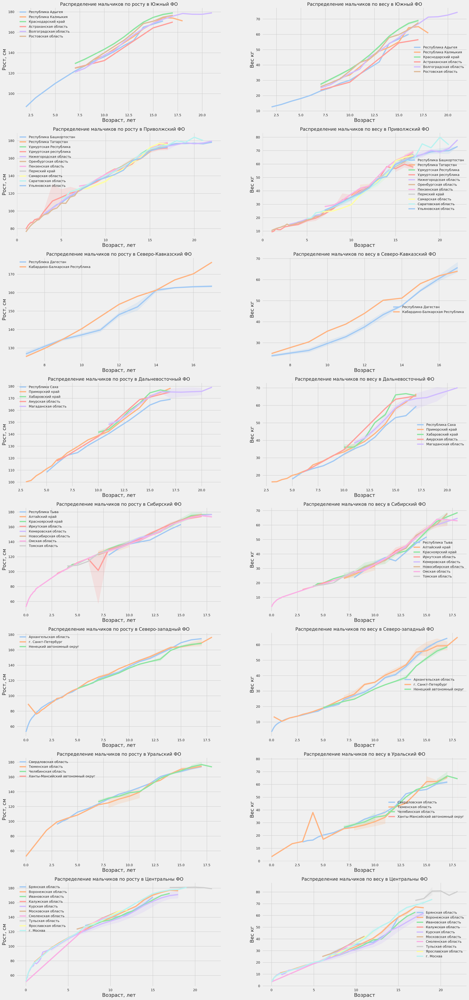

In [28]:
from pandas.plotting import scatter_matrix

fig, axes = plt.subplots(nrows=8, ncols=2, dpi=200, figsize=(24, 56))
col=0
# line,ax1 = plt.subplots(figsize=(12,8))
for fo in fo_list:
  # print(fo)
  res_df = df[(df['FO'] == fo) & (df['ПолIdx'] == 1)]
  new_df = res_df[['Sbj', 'Рост', 'Вес', 'Возраст']].copy()
  new_df = new_df.astype({"Вес": float, "Рост": float, "Возраст": float})
  ax1 = sns.lineplot(x="Возраст", y="Рост", data=new_df,palette="pastel", hue="Sbj", ax=axes[col,0])
  ax1.set_title("Распределение мальчиков по росту в " + fo, fontsize=15)
  ax1.set_xlabel ("Возраст, лет")
  ax1.set_ylabel ("Рост, см")
  ax1.legend (loc="best");
  fig.savefig("simplelineplotChart.png");

  ax2 = sns.lineplot(x="Возраст", y="Вес", data=new_df,palette="pastel", hue="Sbj", ax=axes[col,1])
  ax2.set_title("Распределение мальчиков по весу в " + fo, fontsize=15)
  ax2.set_xlabel ("Возраст")
  ax2.set_ylabel ("Вес кг")
  ax2.legend (loc="right");
  fig.savefig("simplelineplotChart.png");

  col = col + 1


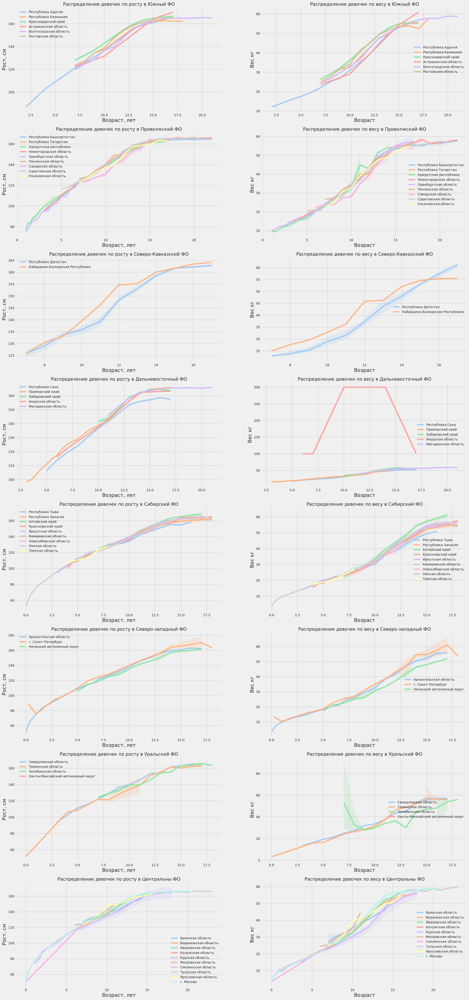

In [29]:
from pandas.plotting import scatter_matrix

fig, axes = plt.subplots(nrows=8, ncols=2, dpi=200, figsize=(24, 56))
col=0
# line,ax1 = plt.subplots(figsize=(12,8))
for fo in fo_list:
  # print(fo)
  res_df = df[(df['FO'] == fo) & (df['ПолIdx'] == 2)]
  new_df = res_df[['Sbj', 'Рост', 'Вес', 'Возраст']].copy()
  new_df = new_df.astype({"Вес": float, "Рост": float, "Возраст": float})
  ax1 = sns.lineplot(x="Возраст", y="Рост", data=new_df,palette="pastel", hue="Sbj", ax=axes[col,0])
  ax1.set_title("Распределение девочек по росту в " + fo, fontsize=15)
  ax1.set_xlabel ("Возраст, лет")
  ax1.set_ylabel ("Рост, см")
  ax1.legend (loc="best");
  fig.savefig("simplelineplotChart.png");

  ax2 = sns.lineplot(x="Возраст", y="Вес", data=new_df,palette="pastel", hue="Sbj", ax=axes[col,1])
  ax2.set_title("Распределение девочек по весу в " + fo, fontsize=15)
  ax2.set_xlabel ("Возраст")
  ax2.set_ylabel ("Вес кг")
  ax2.legend (loc="right");
  fig.savefig("simplelineplotChart.png");

  col = col + 1



# res_df = df[(df['FO_Cod'] == 3) & (df['ПолIdx'] == 2)]
# # res_df = df[df['ПолIdx'] == 1]
# res_df

<a id="0"></a>
<font color="red" size=+3><b>!!! внимание Обнаружены ошибки в данных</b></font>

<font color="- вес девочек в Амурской области 300 кг" size=+3><b>- вес девочек в Амурской области 300 кг</b></font>

<font color="" size=+3><b>- вес девочек и мальчиков в Смоленской области >3000 кг</b></font>

<font color="" size=+3><b>- есть выброс веса 40 кг для  Мальчиков до 5 лет в Тюменской области/ проверить не ошибка ли?</b></font>

<font color="green" size=+3><b>видимо в БД по Смоленской области вес детей до 7-8 лет записан в граммах, хотя в таблице указаны ед/изм киллограмм </b></font>

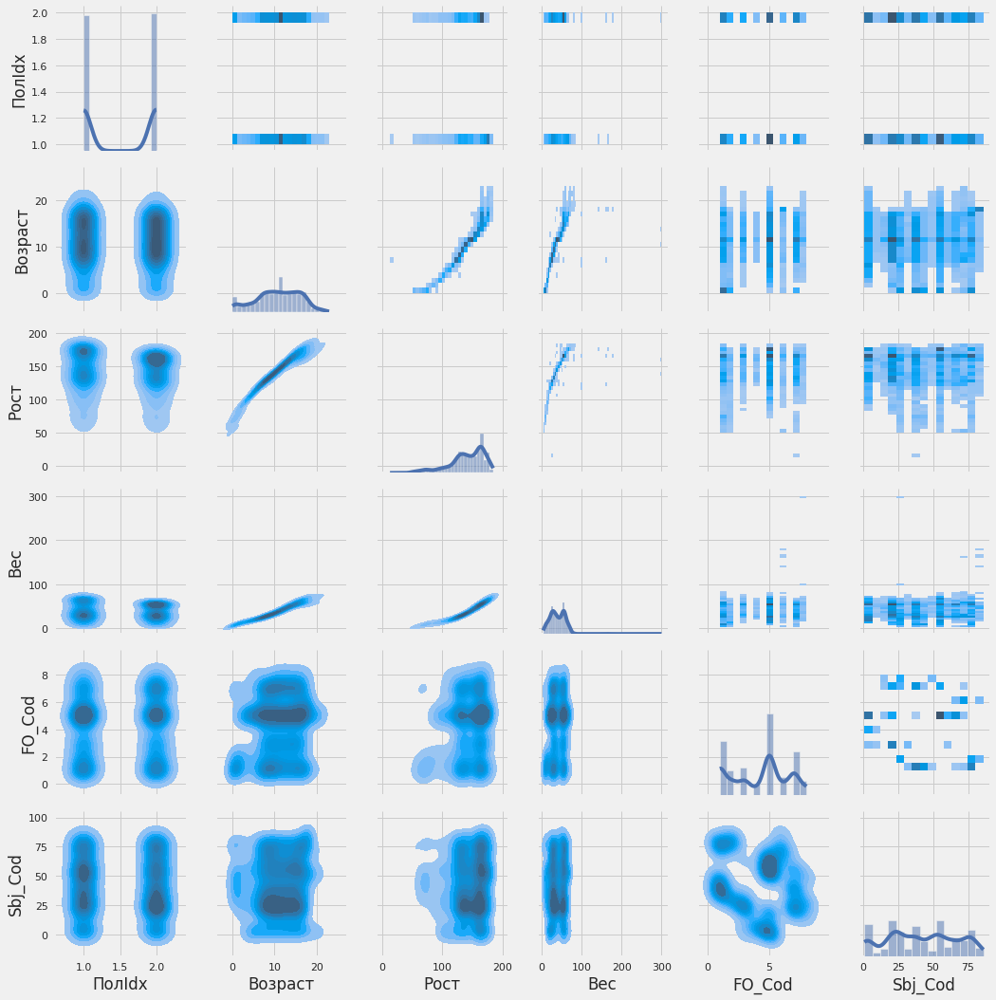

In [30]:
configure_plotly_browser_state()
g = sns.PairGrid(df)
g.map_upper(sns.histplot)
g.map_lower(sns.kdeplot, fill=True)
g.map_diag(sns.histplot, kde=True)

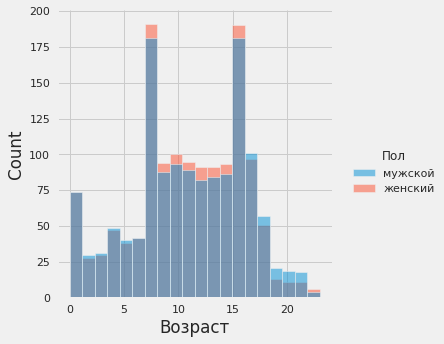

In [40]:
sns.displot(data = df , x = 'Возраст',  bins=20, hue = 'Пол')

<AxesSubplot:xlabel='Рост', ylabel='Density'>

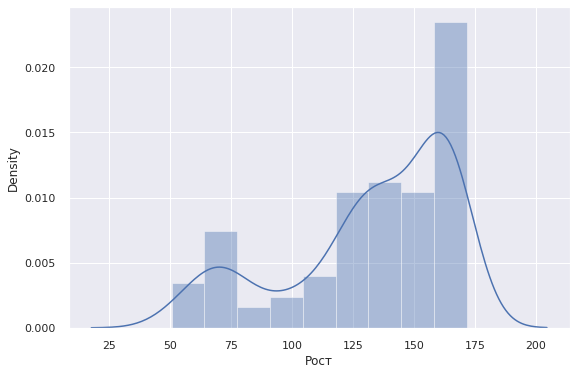

In [41]:
configure_plotly_browser_state()
sns.set(style = 'darkgrid')
sns.distplot(new_df['Рост'])

<AxesSubplot:>

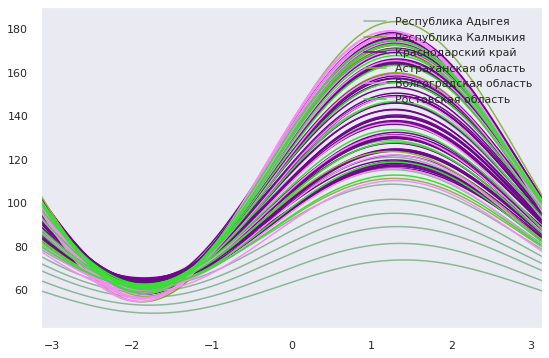

In [59]:
pd.plotting.andrews_curves(new_df, 'Sbj')

In [31]:
plot_df = df

drop_str = ['ПолIdx', 'Возраст', 'Sbj_Cod', 'FJ_Cod']

for i in range(len(drop_str)):
  if drop_str[i] in df.columns:
    plot_df = plot_df.drop([drop_str[i]], axis=1)

import plotly.express as px
#fig = px.parallel_categories(df)
configure_plotly_browser_state()
fig = px.parallel_categories(plot_df, color="Рост", 
                    color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)

fig.show()

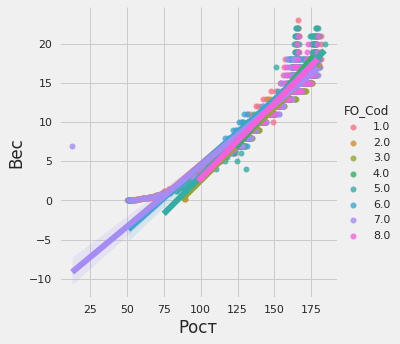

In [32]:
# Plot sepal width as a function of sepal_length across days
g = sns.lmplot(
    data=df,
    x="Рост", y="Возраст", hue="FO_Cod",
    height=5
)

# Use more informative axis labels than are provided by default
g.set_axis_labels("Рост", "Вес")

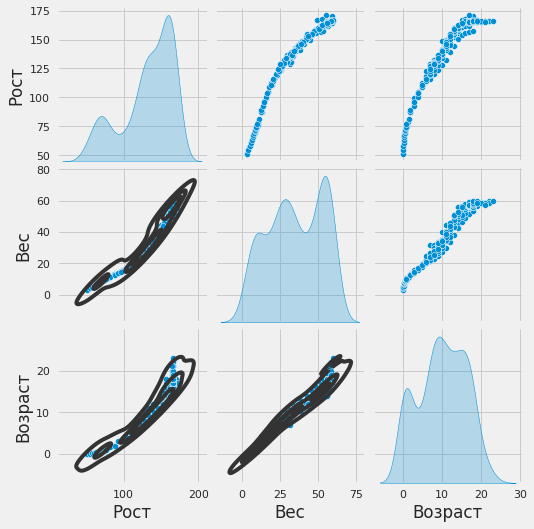

In [33]:
g = sns.pairplot(new_df, diag_kind="kde")
g.map_lower(sns.kdeplot, levels=4, color=".2")

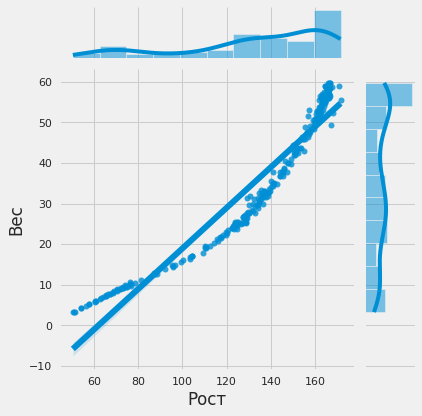

In [34]:
sns.jointplot(x = 'Рост', y = 'Вес', data = new_df, kind = 'reg')

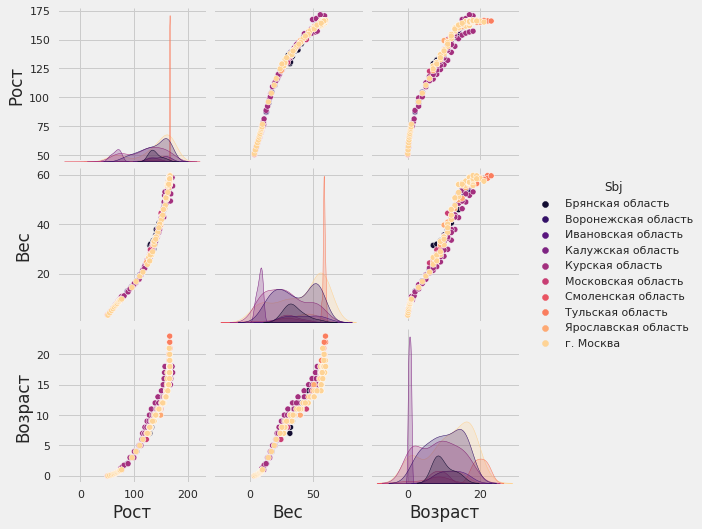

In [35]:
sns.pairplot(new_df, hue = 'Sbj', palette = 'magma')

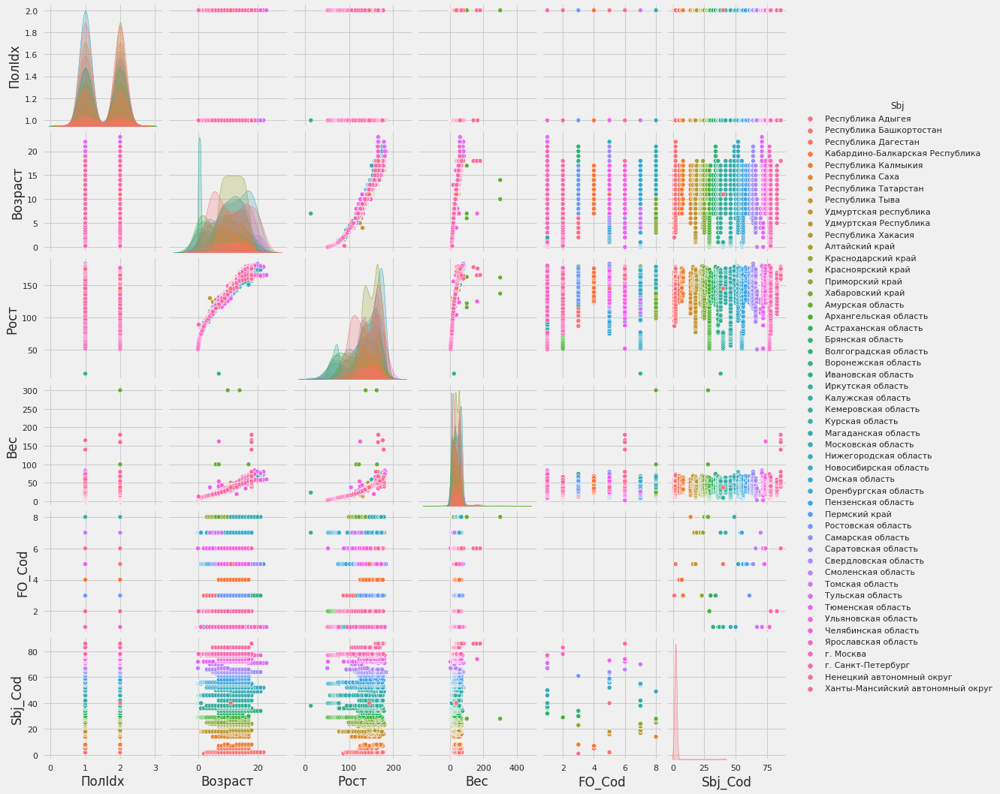

In [37]:
# делаем различные распределения для выявления аномалий в данных
sns.pairplot(df, hue ='Sbj')
plt.show()

# !!!!!!!!!
# !!! на графиках видны аномалии по весу в зоне 300 кг
# нужно выверять данные


# 5. Машинное обучение

# 6. Результаты

#7. Выводы и рекомендации